In [1]:
import tifffile
import pathlib
import numpy as np
import pandas as pd
from tqdm import tqdm

<Axes: >

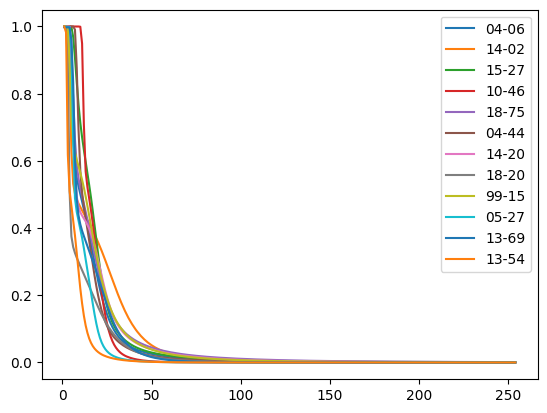

In [5]:
image_output = pd.DataFrame({
    folder.name[:-4]: pd.Series([
        np.mean(tifffile.imread(folder)[::10, ::10].reshape(-1)[tifffile.imread(folder)[::10, ::10].reshape(-1) >= 1] > i) for i in range(255)
    ])
    for folder in tqdm(pathlib.Path("/oak/stanford/projects/kibr/Reorganizing/Projects/James/lipid-droplet-pipeline/data/raw/slides/plin2/").glob("*-*.tif"))
})

image_output.loc[1:].plot.line()

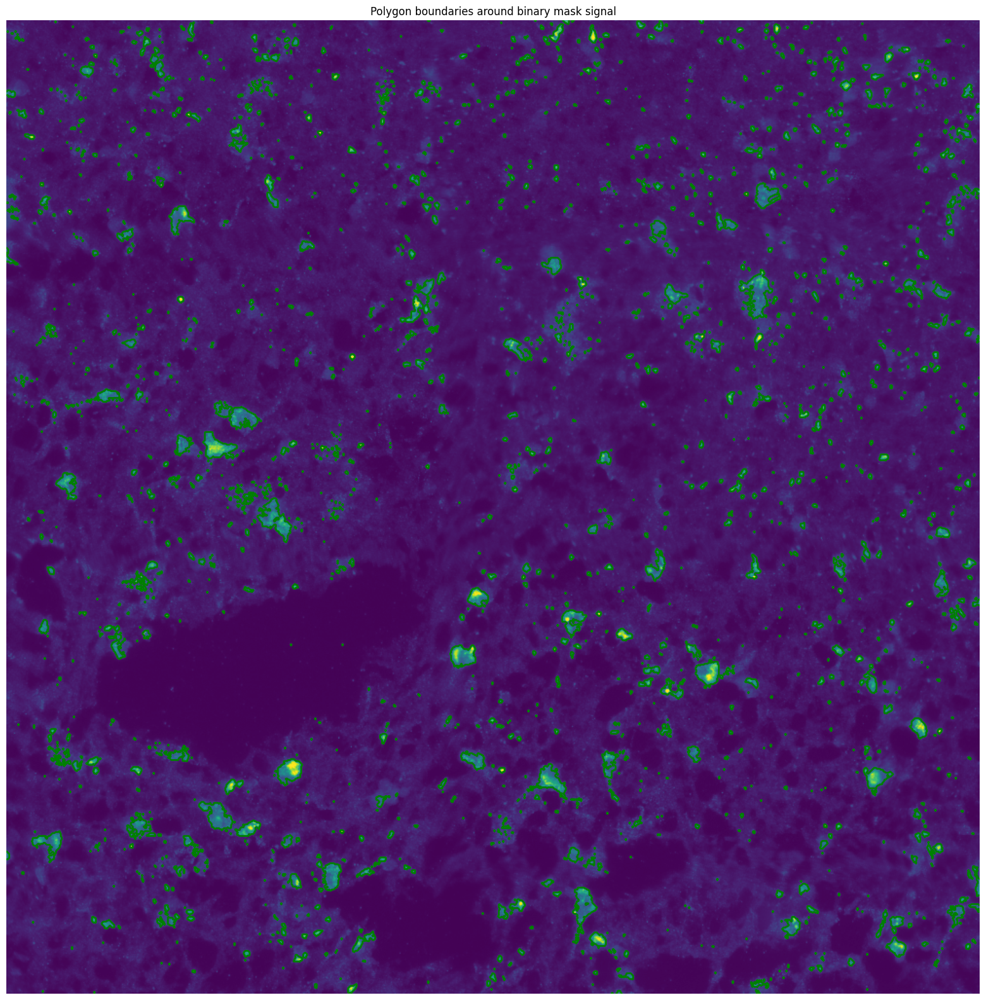

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import measure

plin_raw = tifffile.imread("/oak/stanford/projects/kibr/Reorganizing/Projects/James/lipid-droplet-pipeline/data/raw/slides/oil-red-o/15-27.tif")

# Find contours at a constant value of 0.5 to get edges between 0 and 1
contours = measure.find_contours(plin_raw[5_000:6_000, 5_000:6_000]>64, level=.5)

fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(plin_raw[5_000:6_000, 5_000:6_000])

for contour in contours:
    ax.plot(contour[:, 1], contour[:, 0], linewidth=2, color='green')

plt.title("Polygon boundaries around binary mask signal")
plt.axis('off')
plt.show()

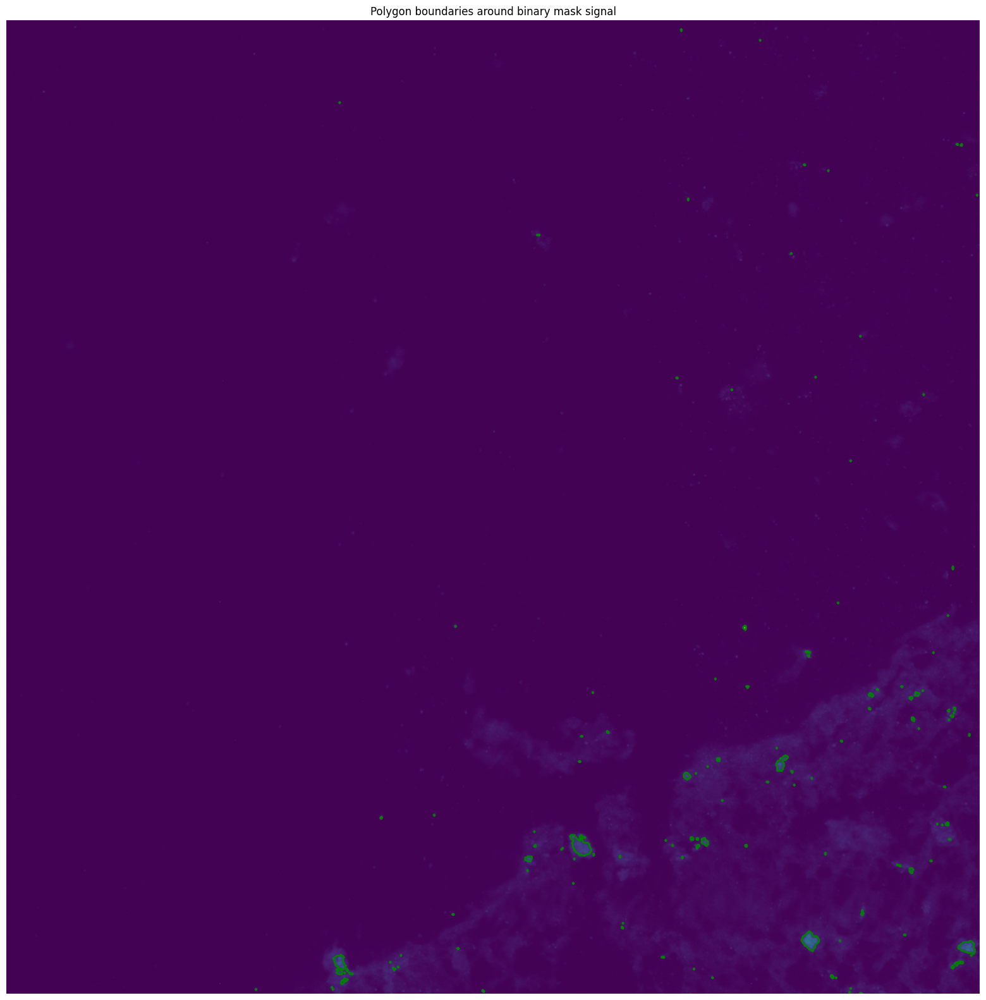

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import measure

plin_raw = tifffile.imread("/oak/stanford/projects/kibr/Reorganizing/Projects/James/lipid-droplet-pipeline/data/raw/slides/plin2/13-54.tif")

# Find contours at a constant value of 0.5 to get edges between 0 and 1
contours = measure.find_contours(plin_raw[5_000:6_000, 5_000:6_000]>25, level=.5)

fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(plin_raw[5_000:6_000, 5_000:6_000])

for contour in contours:
    ax.plot(contour[:, 1], contour[:, 0], linewidth=2, color='green')

plt.title("Polygon boundaries around binary mask signal")
plt.axis('off')
plt.show()

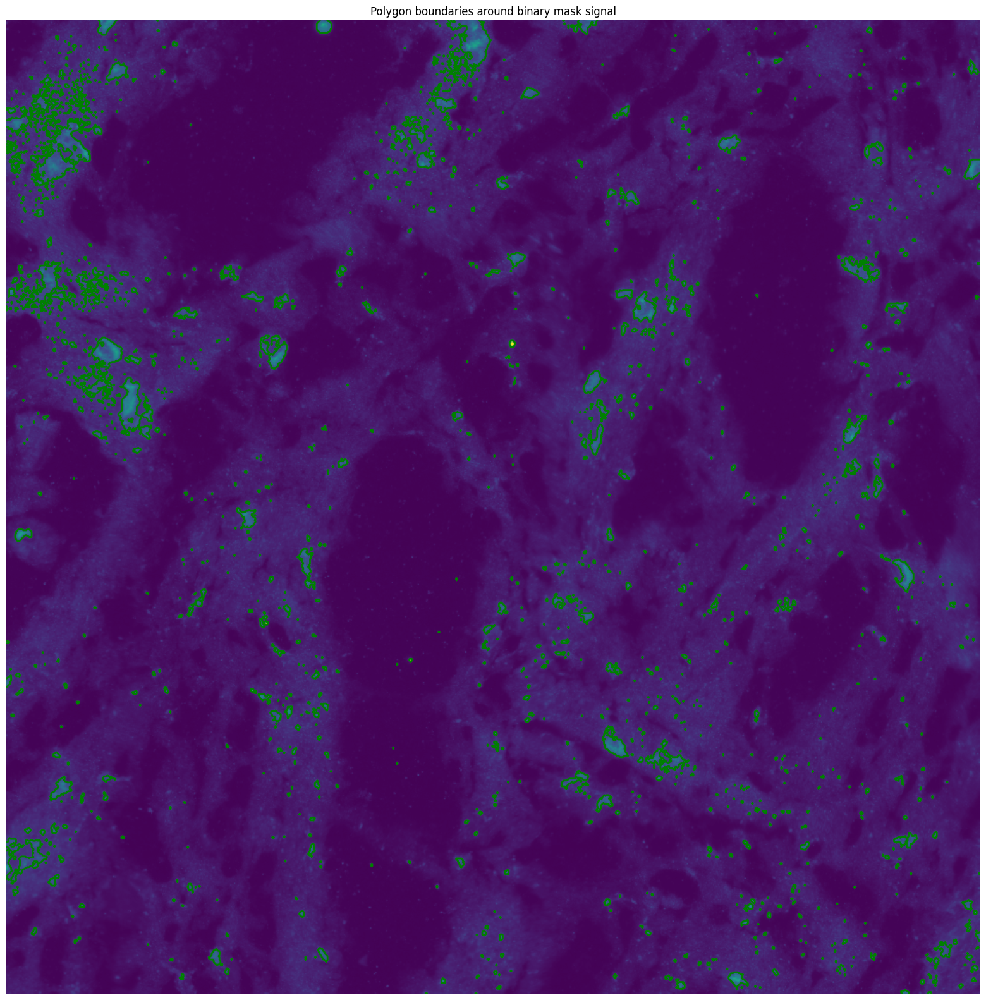

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import measure

plin_raw = tifffile.imread("/oak/stanford/projects/kibr/Reorganizing/Projects/James/lipid-droplet-pipeline/data/raw/slides/plin2/18-20.tif")

# Find contours at a constant value of 0.5 to get edges between 0 and 1
contours = measure.find_contours(plin_raw[5_000:6_000, 5_000:6_000]>50, level=.5)

fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(plin_raw[5_000:6_000, 5_000:6_000])

for contour in contours:
    ax.plot(contour[:, 1], contour[:, 0], linewidth=2, color='green')

plt.title("Polygon boundaries around binary mask signal")
plt.axis('off')
plt.show()

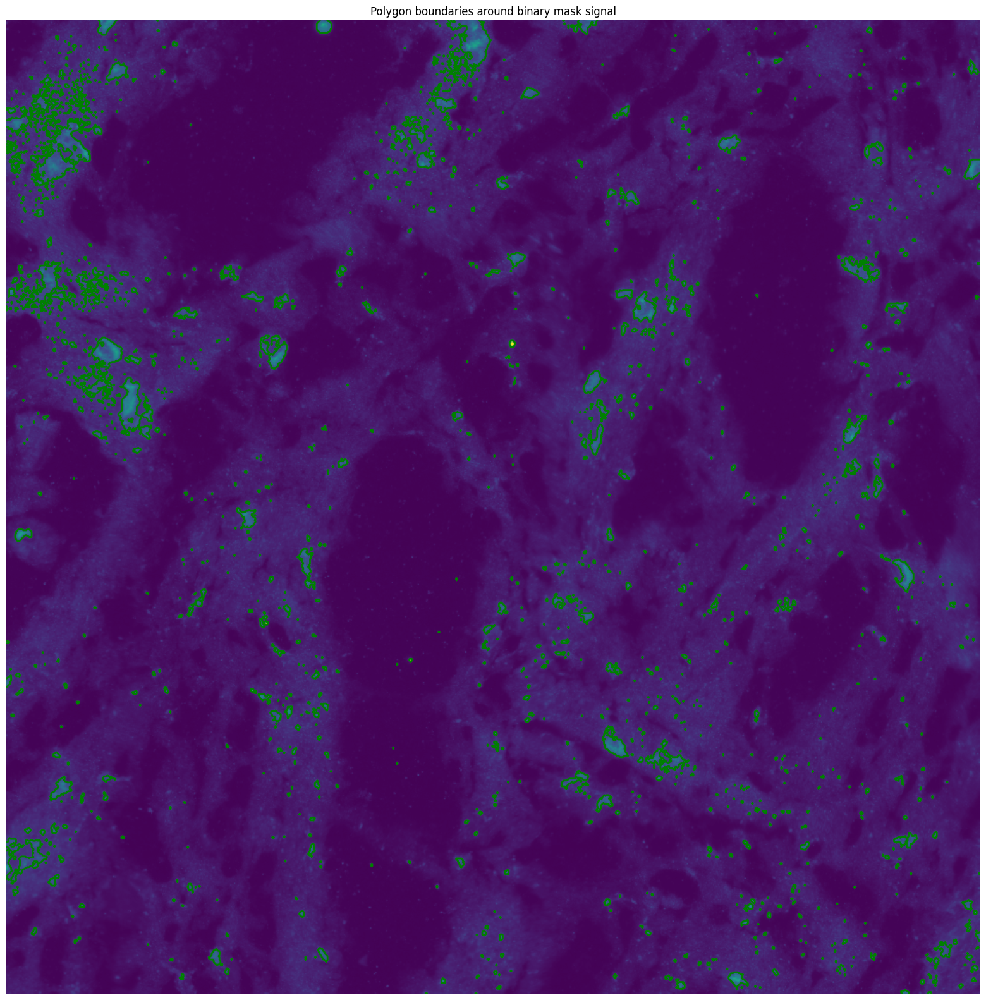

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import measure

plin_raw = tifffile.imread("/oak/stanford/projects/kibr/Reorganizing/Projects/James/lipid-droplet-pipeline/data/raw/slides/plin2/18-20.tif")

# Find contours at a constant value of 0.5 to get edges between 0 and 1
contours = measure.find_contours(plin_raw[5_000:6_000, 5_000:6_000]>50, level=.5)

fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(plin_raw[5_000:6_000, 5_000:6_000])

for contour in contours:
    ax.plot(contour[:, 1], contour[:, 0], linewidth=2, color='green')

plt.title("Polygon boundaries around binary mask signal")
plt.axis('off')
plt.show()

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import measure

plin_raw = tifffile.imread("/oak/stanford/projects/kibr/Reorganizing/Projects/James/lipid-droplet-pipeline/data/raw/slides/oil-red-o/0029269_AD_33_04-44_15-27.ome.tif")

# Find contours at a constant value of 0.5 to get edges between 0 and 1
contours = measure.find_contours(plin_raw[5_000:6_000, 5_000:6_000]>50, level=.5)

fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(plin_raw[5_000:6_000, 5_000:6_000])

for contour in contours:
    ax.plot(contour[:, 1], contour[:, 0], linewidth=2, color='green')

plt.title("Polygon boundaries around binary mask signal")
plt.axis('off')
plt.show()

KeyboardInterrupt: 

In [1]:
import tifffile
img = tifffile.imread(
    "/oak/stanford/projects/kibr/Reorganizing/Projects/James/lipid-droplet-pipeline/data/raw/slides/oil-red-o/0029269_AD_33_04-44_15-27.ome.tif" 
)

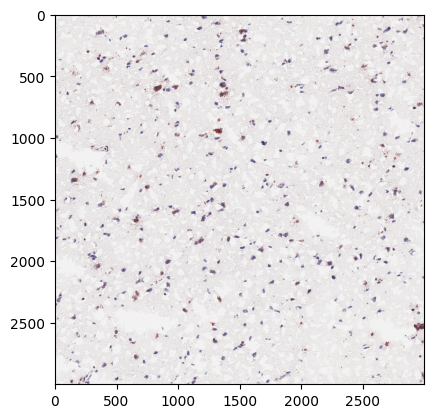

In [9]:
import matplotlib.pyplot as plt
plt.imshow(img[30000:33000, 20000:23000])

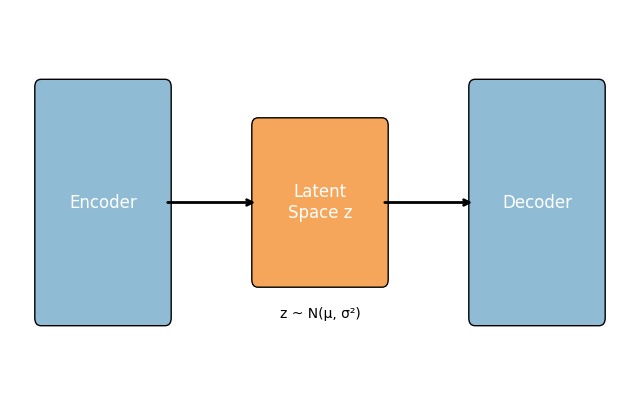

In [11]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

fig, ax = plt.subplots(figsize=(8, 5))
ax.set_xlim(0, 10)
ax.set_ylim(0, 5)
ax.axis('off')  # hide axes

# Encoder
encoder_box = patches.FancyBboxPatch((0.5, 1), 2, 3, boxstyle="round,pad=0.1", facecolor="#8fbcd4")
ax.add_patch(encoder_box)
ax.text(1.5, 2.5, "Encoder", fontsize=12, ha="center", va="center", color="white")

# Latent space
latent_box = patches.FancyBboxPatch((4, 1.5), 2, 2, boxstyle="round,pad=0.1", facecolor="#f5a65a")
ax.add_patch(latent_box)
ax.text(5, 2.5, "Latent\nSpace z", fontsize=12, ha="center", va="center", color="white")

# Decoder
decoder_box = patches.FancyBboxPatch((7.5, 1), 2, 3, boxstyle="round,pad=0.1", facecolor="#8fbcd4")
ax.add_patch(decoder_box)
ax.text(8.5, 2.5, "Decoder", fontsize=12, ha="center", va="center", color="white")

# Arrows: Encoder -> Latent -> Decoder
ax.annotate('', xy=(4, 2.5), xytext=(2.5, 2.5), arrowprops=dict(arrowstyle="->", lw=2))
ax.annotate('', xy=(7.5, 2.5), xytext=(6, 2.5), arrowprops=dict(arrowstyle="->", lw=2))

# Optionally add epsilon for VAE sampling
ax.text(5, 1, "z ~ N(μ, σ²)", fontsize=10, ha="center")

plt.show()
